# Зелёная энергия

**В одном курортном городе N на солнечном побережье после ряда исследований и переговоров энергетики сошлись на том, что на электростанциях часть блоков пора менять на «зелёные», то есть оборудовать город солнечными батареями. Трудность в том, что такой источник энергии имеет ряд недостатков. В отличие от тепловых электростанций, которые могут контролировать выработку электроэнергии за счёт сжигания большего или меньшего числа органического топлива, солнечные батареи напрямую зависят от погодных условий, а значит, электричество нужно где-то хранить. За переход на новый источник энергии будет отвечать автоматика, и её нужно настроить.** 

**Задача представляет собой линейную регрессию.**

- В качестве метрики оценивания решения выступает коэффициент детерминации, или R2.

**Признаки**
- `DateTime` - дата, месяц/день/год/час/минута
- `Temperature` - температура
- `Humidity` - влажность
- `Wind Speed` - скорость ветра 
- `general diffuse flows` - общие диффузные потоки
- `diffuse flows` - диффузные потоки
- `Energy city` - энергопотребление(target)

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from collections import defaultdict
from tqdm.notebook import tqdm 
plt.style.use('seaborn-ticks')

In [2]:
#загружаем данные
train = pd.read_csv('train_ge.csv', index_col=0, engine='pyarrow')
test = pd.read_csv('test_ge.csv', index_col=0, engine='pyarrow')

train['DateTime'] = pd.to_datetime(train['DateTime'], format='%m/%d/%Y/%H:%M')
test['DateTime'] = pd.to_datetime(test['DateTime'], format='%m/%d/%Y/%H:%M')

# EDA

In [3]:
train.head()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Energy city
,,,,,,,
37934,2021-09-20 10:20:00,30.3541,44.95,5.07481,546.600,62.210,69704.997753
31917,2021-08-09 15:30:00,35.5865,41.38,5.05112,623.700,284.900,99443.498147
28331,2021-07-15 17:50:00,30.8485,72.70,5.06554,412.500,134.900,89005.901292
19788,2021-05-17 10:00:00,25.6676,55.79,5.06348,660.800,653.600,75247.019863
23348,2021-06-11 03:20:00,20.3425,66.28,0.08446,0.066,0.107,77042.028189


In [4]:
def get_info(data):
    print('Duplicates:', data.duplicated().sum())
    print('Table shape:', data.shape)
    print()
    print('Columns:')
    display(data.columns.to_list())
    print('Null values:')
    display(data.isna().sum())
    features = list(set(data.columns) - set(['DateTime']))
    dist = data[features].hist(figsize=(20,15));
    return plt.show()

Duplicates: 0
Table shape: (35118, 7)

Columns:


['DateTime',
 'Temperature',
 'Humidity',
 'Wind Speed',
 'general diffuse flows',
 'diffuse flows',
 'Energy city']

Null values:


DateTime                 0
Temperature              0
Humidity                 0
Wind Speed               0
general diffuse flows    0
diffuse flows            0
Energy city              0
dtype: int64

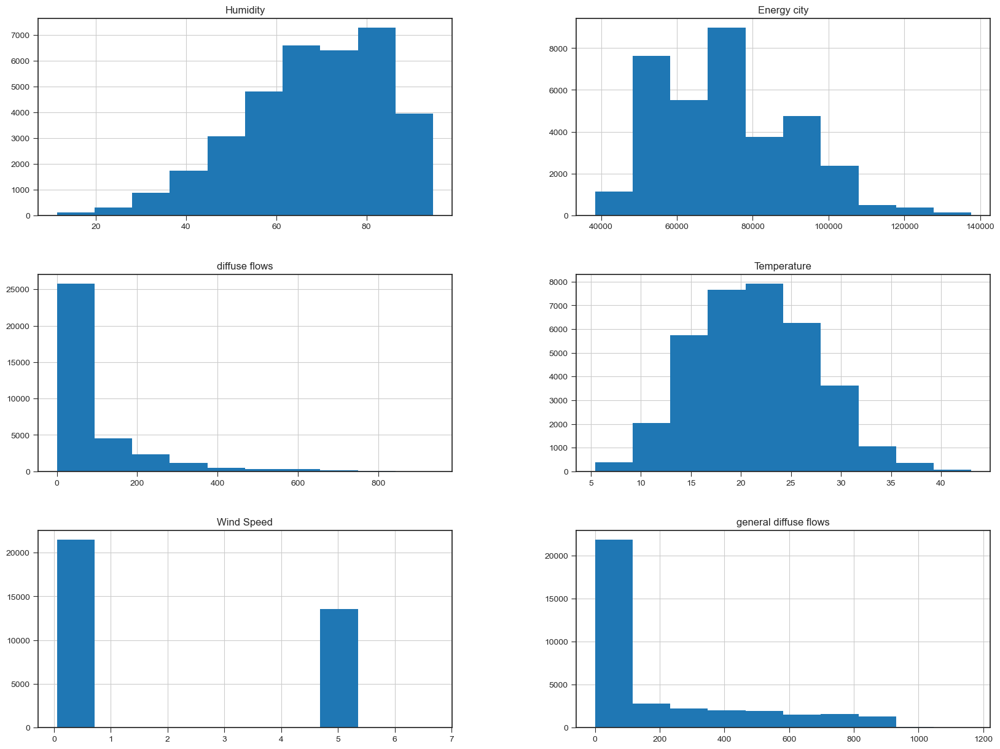

In [5]:
get_info(train)

In [6]:
test.head()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Energy city
,,,,,,,
15506,2021-04-17 16:20:00,25.5028,29.73,0.08755,615.500,664.800,0
51943,2021-12-26 17:10:00,18.4576,54.44,0.08755,19.120,19.340,0
212,2021-01-01 11:20:00,17.5924,57.23,0.07828,396.600,40.660,0
11210,2021-03-18 20:20:00,14.8526,72.30,0.08343,0.062,0.148,0
16307,2021-04-23 05:50:00,17.0774,80.60,0.08240,0.018,0.204,0


Duplicates: 0
Table shape: (17298, 7)

Columns:


['DateTime',
 'Temperature',
 'Humidity',
 'Wind Speed',
 'general diffuse flows',
 'diffuse flows',
 'Energy city']

Null values:


DateTime                 0
Temperature              0
Humidity                 0
Wind Speed               0
general diffuse flows    0
diffuse flows            0
Energy city              0
dtype: int64

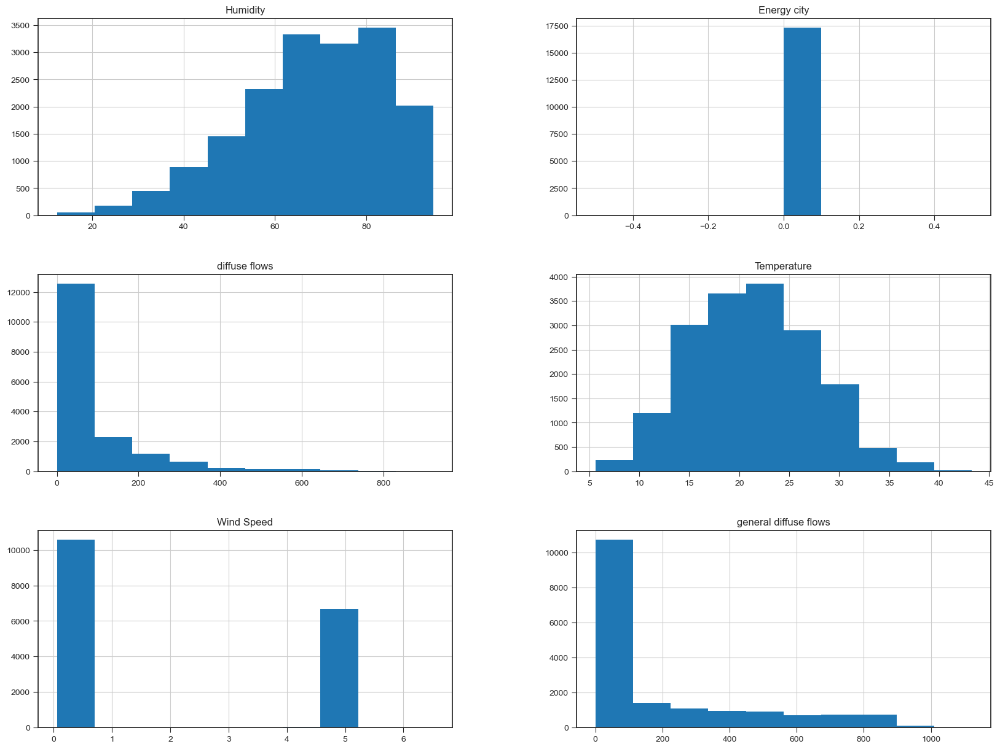

In [7]:
get_info(test)

### Вывод:
- **Познакомились с данными:**
    - **Таблица `train`: 35к объектов, 7 признаков, дубликатов и пропусков не обнаружено**
    - **Таблица `test`: 17к объектов, 7 признаков, дубликатов и пропусков не обнаружено**

In [8]:
def get_time(data):
    data = data.copy()
    data['year'] = data['DateTime'].dt.year
    data['month'] = data['DateTime'].dt.month
    data['hour'] = data['DateTime'].dt.hour
    # Понед = 0, Воскр = 6
    data['day_of_week'] = data['DateTime'].dt.dayofweek
    data['minutes'] = data['DateTime'].dt.minute
    return data

In [9]:
train_time = get_time(train)
train_time.head()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Energy city,year,month,hour,day_of_week,minutes
,,,,,,,,,,,,
37934,2021-09-20 10:20:00,30.3541,44.95,5.07481,546.600,62.210,69704.997753,2021,9,10,0,20
31917,2021-08-09 15:30:00,35.5865,41.38,5.05112,623.700,284.900,99443.498147,2021,8,15,0,30
28331,2021-07-15 17:50:00,30.8485,72.70,5.06554,412.500,134.900,89005.901292,2021,7,17,3,50
19788,2021-05-17 10:00:00,25.6676,55.79,5.06348,660.800,653.600,75247.019863,2021,5,10,0,0
23348,2021-06-11 03:20:00,20.3425,66.28,0.08446,0.066,0.107,77042.028189,2021,6,3,4,20


In [10]:
#по каждому году, какие месяцы представлены
train_time.groupby('year')['month'].agg(['unique'])

,unique
year,
2020,[12]
2021,"[9, 8, 7, 5, 6, 12, 10, 1, 4, 11, 2, 3]"


In [11]:
def get_time_plot(data, time: str, hue: str):
    plt.title(f'Distribution by {time}')
    sns.lineplot(data=data, x=time, y='Energy city', hue=hue, palette='coolwarm', ci=None)
    plt.grid(visible=True)
    return plt.show()

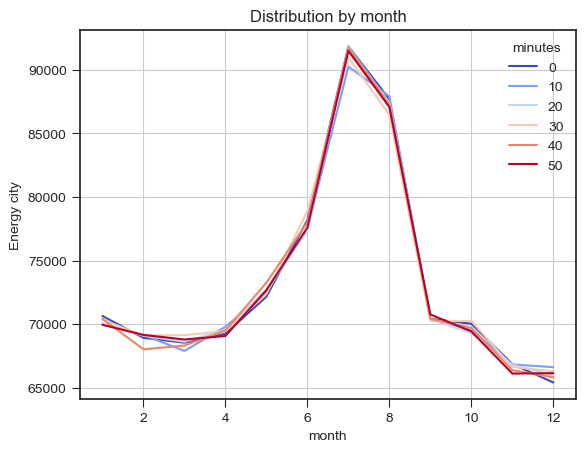

In [12]:
get_time_plot(train_time, 'month', 'minutes')

**Вывод:**
- **Посмотрим на потребление электроэнергии по месяцам и минутам, особо ничего не выделить, как в начале часа так и в конце энергопотребление одинаковое, рост энергопотребления начинается с апреля(4 месяц) выходит на пик в июле(7 месяц) далее начинается спад**

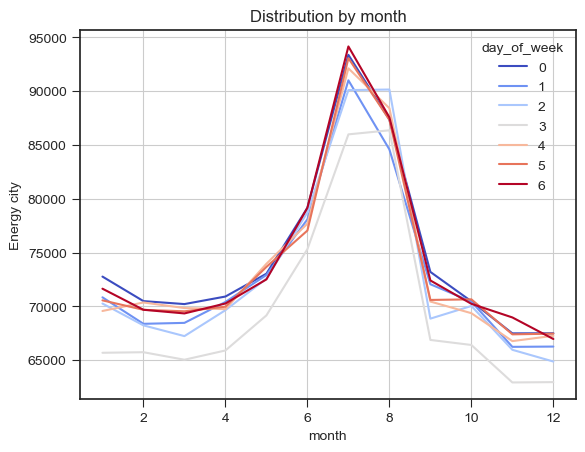

In [13]:
get_time_plot(train_time, 'month', 'day_of_week')

**Вывод:**
- **Потребление электроэнергии по месяцам и дням недели,явная просадка на третий день(серая линия), то есть в четверг электроэнергии потребляют меньше чем в остальные дни**

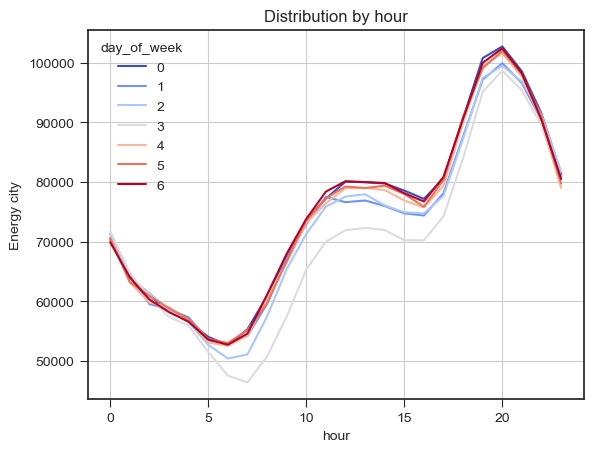

In [14]:
get_time_plot(train_time, 'hour', 'day_of_week')

**Вывод:**
- **Потребление электроэнергии по часам и дням недели. Рост начинается примерно с 5:30 утра и достигает пика к 20:00**

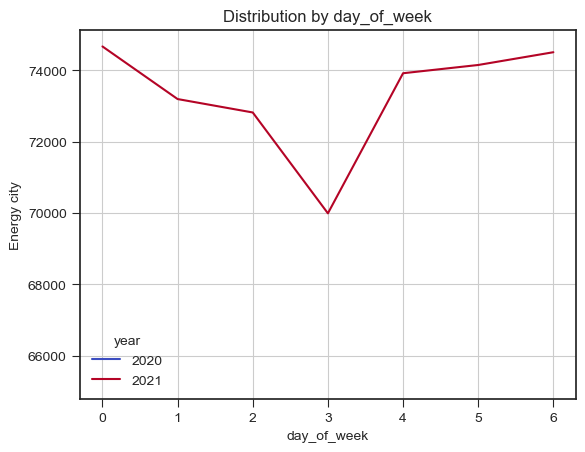

In [15]:
get_time_plot(train_time, 'day_of_week', 'year')

**Вывод:**
- **С понедельника по четверг потребление электроэнергии снижается, а с четверга по понедельник выходит на максимум**

In [16]:
train_time.groupby('day_of_week')['Energy city'].agg(['min', 'max'])

,min,max
day_of_week,,
0,43580.084938,137685.441343
1,38481.327871,129852.860222
2,38384.890523,131500.888352
3,38366.617485,130005.894831
4,39913.053934,136131.656370
5,44800.490554,137104.719350
6,44271.755191,136770.452194


**Вывод:**
- **На данной сводной таблице представлены минимум и максимум энергопотребления по дням недели, можно отметить что пик приходится на понедельник(0 день)**

In [17]:
train_time.head()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Energy city,year,month,hour,day_of_week,minutes
,,,,,,,,,,,,
37934,2021-09-20 10:20:00,30.3541,44.95,5.07481,546.600,62.210,69704.997753,2021,9,10,0,20
31917,2021-08-09 15:30:00,35.5865,41.38,5.05112,623.700,284.900,99443.498147,2021,8,15,0,30
28331,2021-07-15 17:50:00,30.8485,72.70,5.06554,412.500,134.900,89005.901292,2021,7,17,3,50
19788,2021-05-17 10:00:00,25.6676,55.79,5.06348,660.800,653.600,75247.019863,2021,5,10,0,0
23348,2021-06-11 03:20:00,20.3425,66.28,0.08446,0.066,0.107,77042.028189,2021,6,3,4,20


## Общий вывод:
- **Рост энергопотребления начинается с апреля(4 месяц) выходит на пик в июле(7 месяц) далее спад**
- **Просадка по потреблению в четверг**
- **По часам, рост энергопотребления начинается примерно с 5:30 утра и достигает пика к 20:00**
---

**base_line predictions**

In [18]:
def make_predict(data, model):
    scaler = StandardScaler()
    y = data['Energy city'].copy()
    
    X_train, X_test, y_train, y_test = train_test_split(data.drop(['DateTime', 'Energy city'], axis=1), y,
                                                       test_size=0.33, random_state=1)
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    model = model
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    score = r2_score(y_test, y_pred)
    return score

In [19]:
#baseline
make_predict(train_time, LinearRegression(n_jobs=-1))

0.6318718458058856

**Seasons**
- **Попробуем разбить дату на сезоны, в 2х вариантах на 4 сезона и на 3**

In [20]:
def make_cnt_season(data, cnt):
    data = data.copy()
    data[f'season_{cnt}'] =  (data['month'] % 12 + cnt) // cnt
    return data

In [21]:
# 3 сезона
make_predict(make_cnt_season(train_time, 4), LinearRegression(n_jobs=-1))

0.6419793770145523

In [22]:
# 4 сезона
make_predict(make_cnt_season(train_time, 3), LinearRegression(n_jobs=-1))

0.6433234047975488

**Вывод:**
- **Разделение на 4 сезона получилось лучше чем на 3**

In [23]:
t = make_cnt_season(train_time, 3).copy()
t.head()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Energy city,year,month,hour,day_of_week,minutes,season_3
,,,,,,,,,,,,,
37934,2021-09-20 10:20:00,30.3541,44.95,5.07481,546.600,62.210,69704.997753,2021,9,10,0,20,4
31917,2021-08-09 15:30:00,35.5865,41.38,5.05112,623.700,284.900,99443.498147,2021,8,15,0,30,3
28331,2021-07-15 17:50:00,30.8485,72.70,5.06554,412.500,134.900,89005.901292,2021,7,17,3,50,3
19788,2021-05-17 10:00:00,25.6676,55.79,5.06348,660.800,653.600,75247.019863,2021,5,10,0,0,2
23348,2021-06-11 03:20:00,20.3425,66.28,0.08446,0.066,0.107,77042.028189,2021,6,3,4,20,3


**Попробуем сделать разделение дня по времени**
- утро(05:00 - 11:59)
- полдень(12:00 - 16:59)
- вечер(17:00 - 20:59)
- ночь(21:00 - 04:59)

In [24]:
def categorize_time(row):
    if 5 <= row['hour'] < 12:  
        return 0
    elif 12 <= row['hour'] < 17: 
        return 1/2
    elif 17 <= row['hour'] < 21: 
        return 1
    else:  
        return 1/3

In [25]:
t['part_of_day'] = t.apply(categorize_time, axis=1)
t.head()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Energy city,year,month,hour,day_of_week,minutes,season_3,part_of_day
,,,,,,,,,,,,,,
37934,2021-09-20 10:20:00,30.3541,44.95,5.07481,546.600,62.210,69704.997753,2021,9,10,0,20,4,0.000000
31917,2021-08-09 15:30:00,35.5865,41.38,5.05112,623.700,284.900,99443.498147,2021,8,15,0,30,3,0.500000
28331,2021-07-15 17:50:00,30.8485,72.70,5.06554,412.500,134.900,89005.901292,2021,7,17,3,50,3,1.000000
19788,2021-05-17 10:00:00,25.6676,55.79,5.06348,660.800,653.600,75247.019863,2021,5,10,0,0,2,0.000000
23348,2021-06-11 03:20:00,20.3425,66.28,0.08446,0.066,0.107,77042.028189,2021,6,3,4,20,3,0.333333


In [26]:
make_predict(t, LinearRegression(n_jobs=-1))

0.676293249747461

**Вывод:**
- **Разделение по времени дня оставляем, увеличили R2 с 0.64 до 0.67**

## Feature Engeenering
**Попробуем сделать еще полезных признаков**
- **Средняя: температура / влажность / скорость ветра / общ.дифф. потоки/ дифф. потоки по дням/месяцам/неделям/по части дня**

In [27]:
def make_average(data, feature: str, period: str):
    data = data.copy()
    avg = data.groupby(data[period])[feature].mean()              
    data[f'avg_{feature}_{period}'] = data[period].map(avg)
    return data

In [28]:
period = ['year', 'month', 'hour', 'day_of_week', 'minutes', 'part_of_day']
feats =  ['Temperature', 'Humidity', 'Wind Speed', 'general diffuse flows', 'diffuse flows']

In [29]:
results = defaultdict(list)

for time in tqdm(period):
    for feature in feats:
        results[f'{time}_{feature}'].append(make_predict(make_average(t, feature, time), LinearRegression(n_jobs=-1)))
pd.DataFrame({'r2_score': results}).sort_values('r2_score', ascending=False)

  0%|          | 0/6 [00:00<?, ?it/s]

,r2_score
month_Temperature,[0.7067688026719068]
month_Humidity,[0.7030512324167099]
month_Wind Speed,[0.7026694615180946]
part_of_day_diffuse flows,[0.6935878102397739]
part_of_day_general diffuse flows,[0.6922318109804233]
part_of_day_Humidity,[0.6920672699923982]
part_of_day_Temperature,[0.6912413850083001]
month_general diffuse flows,[0.6839597369467771]
part_of_day_Wind Speed,[0.6827216529614286]
hour_diffuse flows,[0.6807790824225104]


**Вывод:**
- **Лучшим признаком оказалась средняя температура по месяцу, оставим ее**

In [30]:
make_predict(make_average(t, 'Temperature', 'month'), LinearRegression(n_jobs=-1))

0.7067688026719068

In [31]:
t = make_average(t, 'Temperature', 'month').copy()
t.head()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Energy city,year,month,hour,day_of_week,minutes,season_3,part_of_day,avg_Temperature_month
,,,,,,,,,,,,,,,
37934,2021-09-20 10:20:00,30.3541,44.95,5.07481,546.600,62.210,69704.997753,2021,9,10,0,20,4,0.000000,25.291482
31917,2021-08-09 15:30:00,35.5865,41.38,5.05112,623.700,284.900,99443.498147,2021,8,15,0,30,3,0.500000,28.487818
28331,2021-07-15 17:50:00,30.8485,72.70,5.06554,412.500,134.900,89005.901292,2021,7,17,3,50,3,1.000000,30.104243
19788,2021-05-17 10:00:00,25.6676,55.79,5.06348,660.800,653.600,75247.019863,2021,5,10,0,0,2,0.000000,22.983082
23348,2021-06-11 03:20:00,20.3425,66.28,0.08446,0.066,0.107,77042.028189,2021,6,3,4,20,3,0.333333,24.958359


**Посмотрим график зависимостей между признаками**

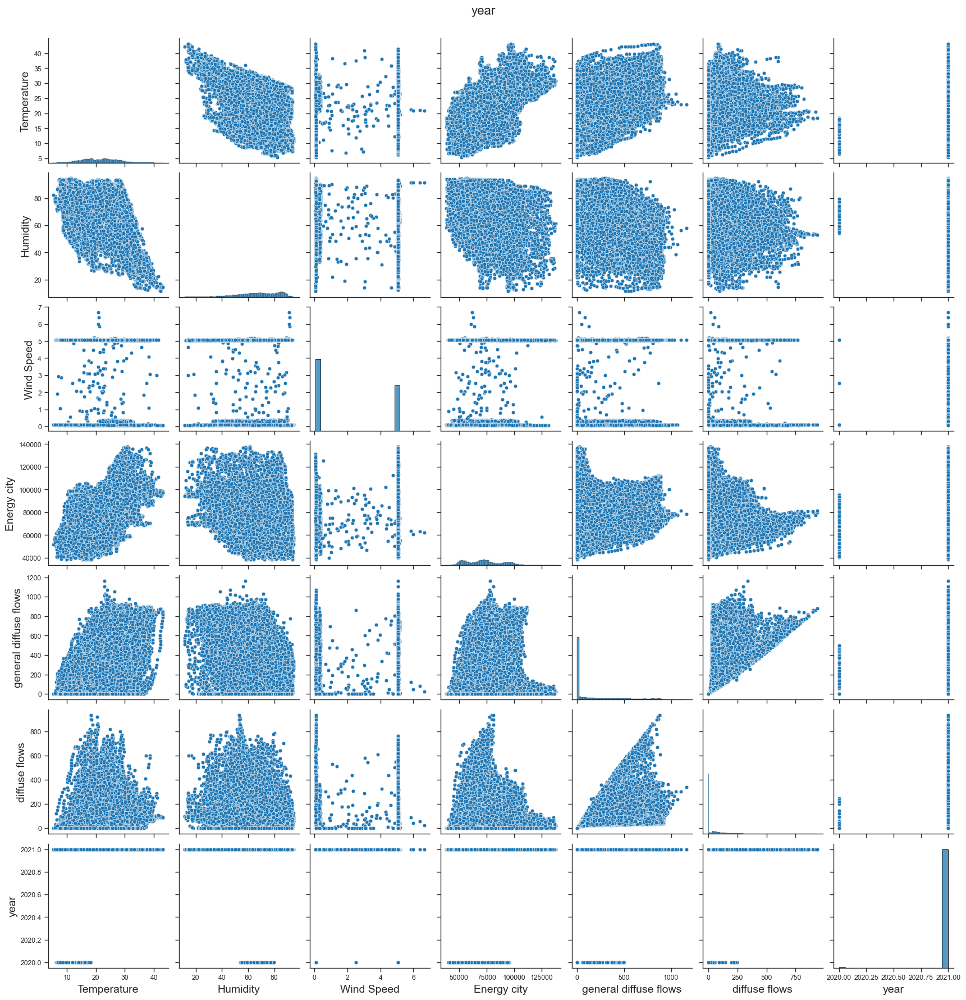

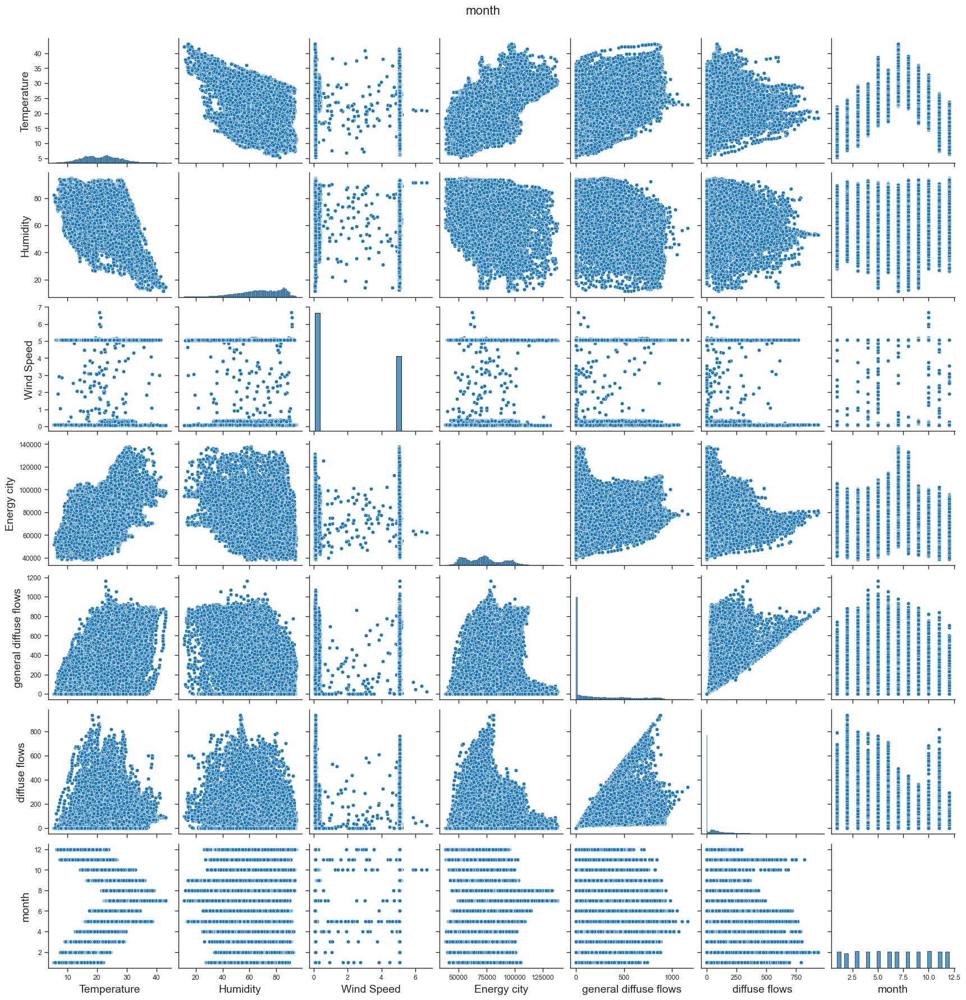

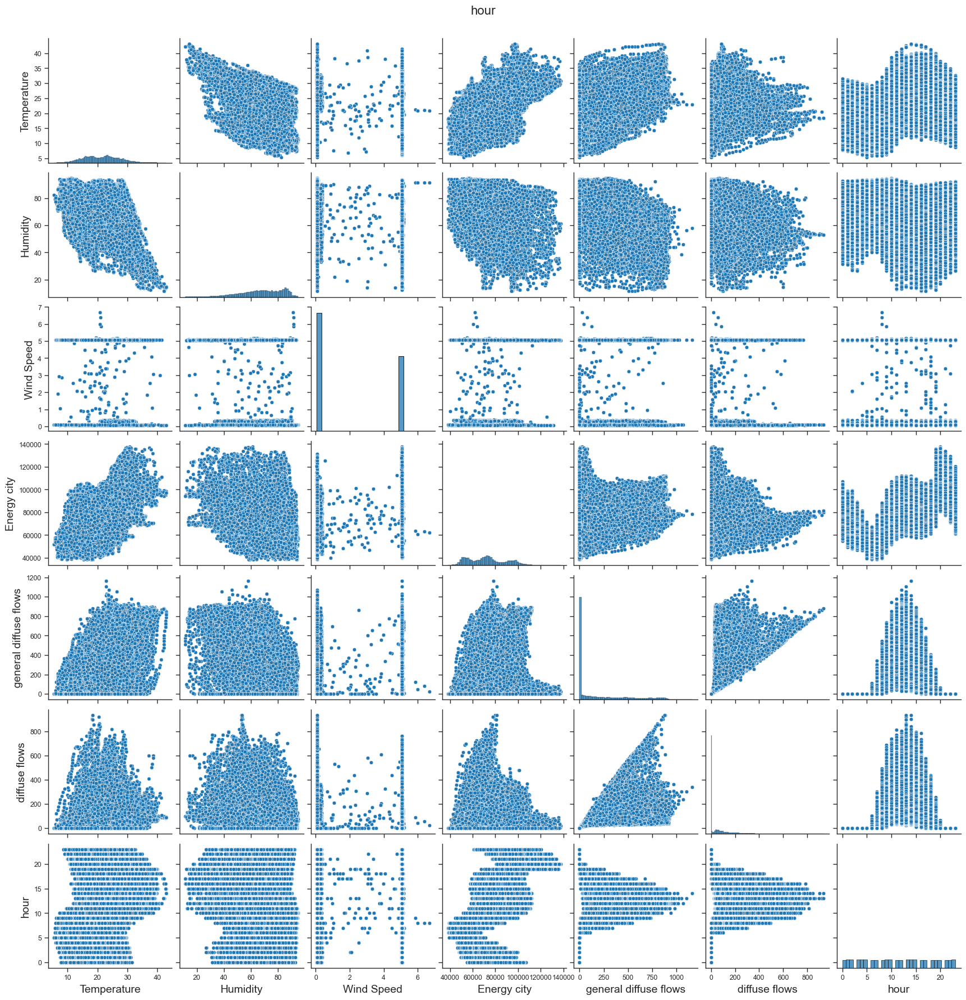

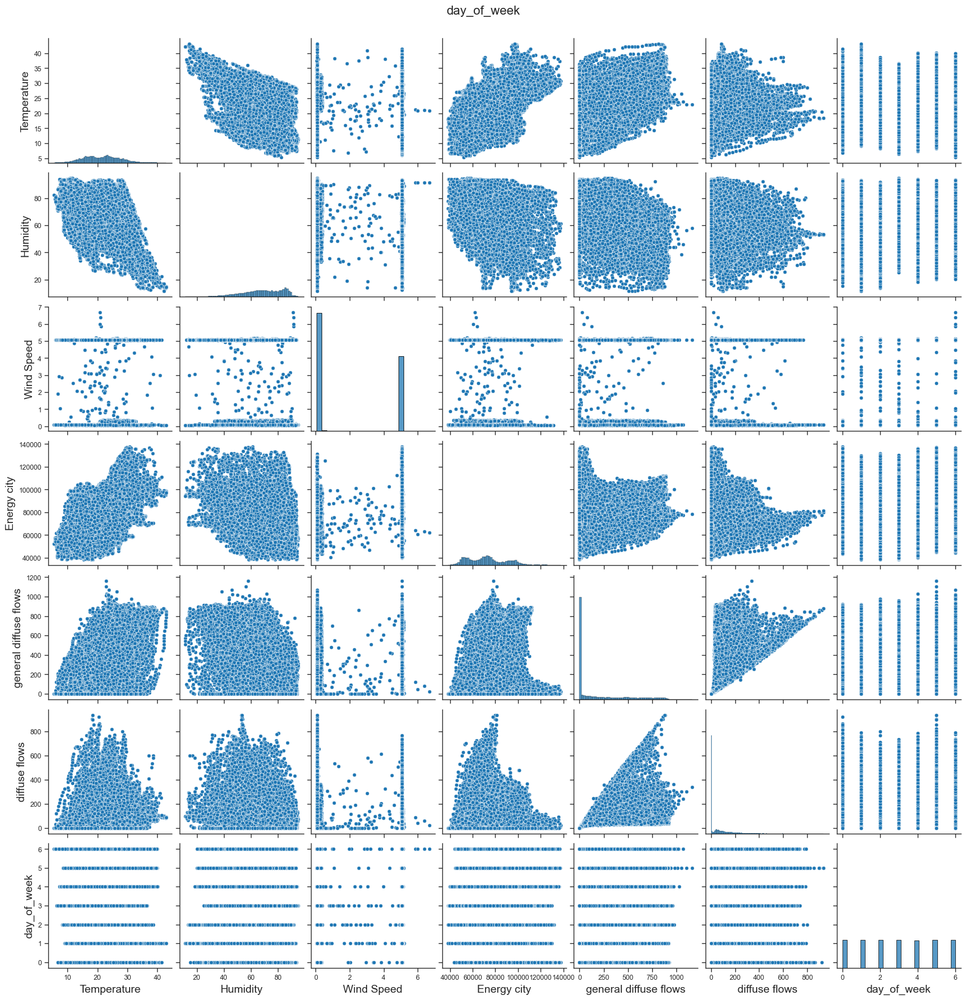

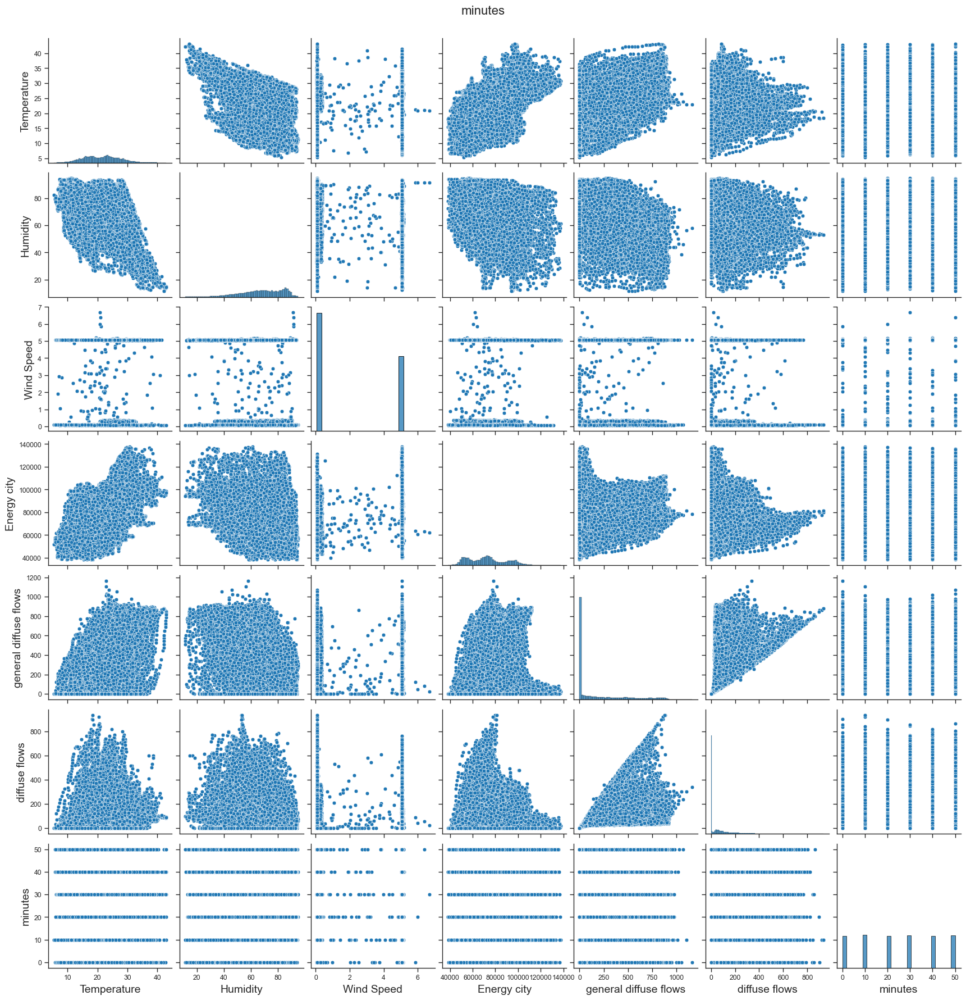

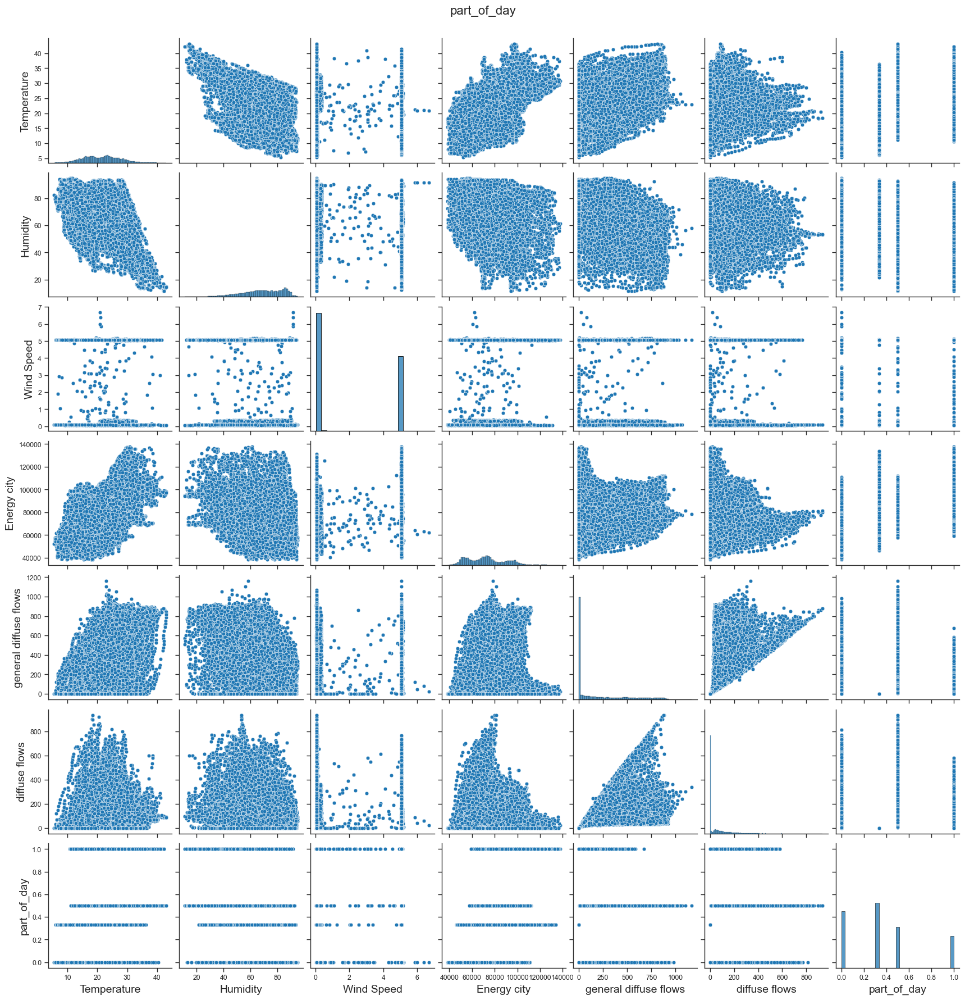

In [32]:
sns.set_context('paper', rc={'axes.labelsize': 14})
selected_features = ['Temperature', 'Humidity', 
                     'Wind Speed', 'Energy city',
                     'general diffuse flows', 'diffuse flows']

for time in period:
    pairplot_data = t[selected_features + [time]]
    pairplot = sns.pairplot(pairplot_data)
    pairplot.fig.suptitle(f'{time}', y=1.02, fontsize=16)
    plt.show()
    print()

**Вывод:**
- **месяц и температура, час и температура, час и влажность рисует зависимости похожие на синусы**

In [34]:
def get_sin_h(data, factor):
    data = data.copy()
    data['hour_sin'] = np.sin(factor * np.pi * data['hour'] / 24)
    return data

def get_cos_h(data, factor):
    data = data.copy()
    data['hour_cos'] = np.cos(factor * np.pi * data['hour'] / 24)
    return data

def get_sin_m(data, factor):
    data = data.copy()
    data['month_sin'] = np.sin(factor * np.pi * data['month'] / 12)
    return data

def get_cos_m(data, factor):
    data = data.copy()
    data['month_cos'] = np.sin(factor * np.pi * data['month'] / 12)
    return data

In [35]:
make_predict(get_sin_h(t, 2.), LinearRegression(n_jobs=-1)), make_predict(get_cos_h(t, 2.), LinearRegression(n_jobs=-1))

(0.7414345487551951, 0.7110224968680032)

In [36]:
make_predict(get_sin_m(t, 2.), LinearRegression(n_jobs=-1)), make_predict(get_cos_m(t, 2.), LinearRegression(n_jobs=-1))

(0.7082248314401478, 0.7082248314401478)

**Вывод:**
- **Синус по часу показал себя лучше,  далее попробуем подобрать фактор влияющий на переодичность колебаний**

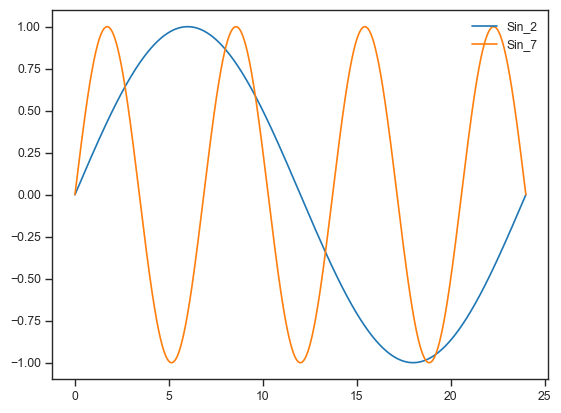

In [37]:
plt.plot(np.linspace(0, 24, 1000), np.sin(2. * np.pi *  np.linspace(0, 24, 1000) / 24), label='Sin_2')
plt.plot(np.linspace(0, 24, 1000), np.sin(7. * np.pi *  np.linspace(0, 24, 1000) / 24), label='Sin_7')
plt.legend(loc='upper right')
plt.show()

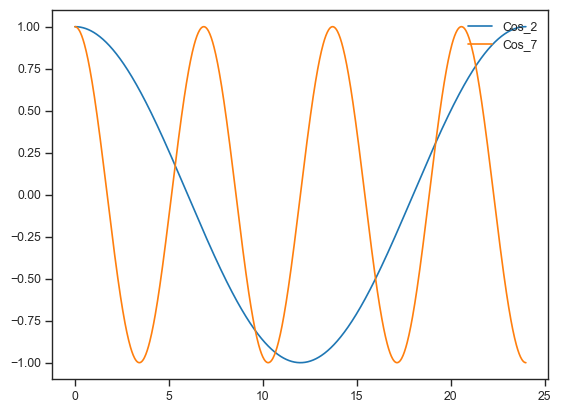

In [38]:
plt.plot(np.linspace(0, 24, 1000), np.cos(2. * np.pi *  np.linspace(0, 24, 1000) / 24), label='Cos_2')
plt.plot(np.linspace(0, 24, 1000), np.cos(7. * np.pi *  np.linspace(0, 24, 1000) / 24), label='Cos_7')
plt.legend(loc='upper right')
plt.show()

**Проверим все варианты**

In [39]:
def search_sin_cos(data, func):
    data = data.copy()
    results = defaultdict(list)
    for factor in tqdm(np.linspace(1, 10, 1000, dtype=float)):
        results[f'{factor}'].append(make_predict(func(data, factor), LinearRegression(n_jobs=-1)))

    res = pd.DataFrame({f'{func.__name__}_factor': results}).sort_values(f'{func.__name__}_factor', ascending=False)[:5] 
    return res

In [40]:
search_sin_cos(t, get_sin_h)

  0%|          | 0/1000 [00:00<?, ?it/s]

,get_sin_h_factor
5.387387387387387,[0.7757662303095152]
5.378378378378378,[0.7757485512046072]
5.396396396396397,[0.7757419492606032]
5.36936936936937,[0.7756888648228875]
5.405405405405405,[0.7756758082119027]


In [41]:
search_sin_cos(t, get_sin_m) 

  0%|          | 0/1000 [00:00<?, ?it/s]

,get_sin_m_factor
4.288288288288289,[0.7219390542763069]
4.2792792792792795,[0.7219362576249244]
4.297297297297297,[0.7219314347948891]
4.27027027027027,[0.7219228781676397]
4.306306306306306,[0.7219135915990869]


In [42]:
search_sin_cos(t, get_cos_h)

  0%|          | 0/1000 [00:00<?, ?it/s]

,get_cos_h_factor
4.603603603603604,[0.8088645693428296]
4.612612612612613,[0.8088521178216538]
4.594594594594595,[0.8088339329468694]
4.621621621621621,[0.8087962556325847]
4.585585585585585,[0.8087605861462197]


In [43]:
search_sin_cos(t, get_cos_m)

  0%|          | 0/1000 [00:00<?, ?it/s]

,get_cos_m_factor
4.288288288288289,[0.7219390542763069]
4.2792792792792795,[0.7219362576249244]
4.297297297297297,[0.7219314347948891]
4.27027027027027,[0.7219228781676397]
4.306306306306306,[0.7219135915990869]


**Вывод:**
- **Лучше всего себя показал косинус по часу с фактором 4.603603603603604, оставим данный признак**

In [44]:
results = defaultdict(list)

for factor in tqdm(np.linspace(-5, 30, 10, dtype=float)):
    results[f'{factor}'].append(make_predict(get_cos_h(t, factor), LinearRegression(n_jobs=-1)))

pd.DataFrame({'cos_factor': results}).sort_values('cos_factor', ascending=False)[:5]

  0%|          | 0/10 [00:00<?, ?it/s]

,cos_factor
-5.0,[0.7712606283128132]
-1.1111111111111112,[0.7331660460839415]
30.0,[0.7169664023498363]
18.333333333333332,[0.7120098231516077]
2.7777777777777777,[0.7106804167128031]


In [45]:
make_predict(get_cos_h(t, 4.603603603603604), LinearRegression(n_jobs=-1))

0.8088645693428296

In [46]:
t = get_cos_h(t, 4.603603603603604).copy()
t.head()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Energy city,year,month,hour,day_of_week,minutes,season_3,part_of_day,avg_Temperature_month,hour_cos
,,,,,,,,,,,,,,,,
37934,2021-09-20 10:20:00,30.3541,44.95,5.07481,546.600,62.210,69704.997753,2021,9,10,0,20,4,0.000000,25.291482,0.967136
31917,2021-08-09 15:30:00,35.5865,41.38,5.05112,623.700,284.900,99443.498147,2021,8,15,0,30,3,0.500000,28.487818,-0.926564
28331,2021-07-15 17:50:00,30.8485,72.70,5.06554,412.500,134.900,89005.901292,2021,7,17,3,50,3,1.000000,30.104243,-0.682516
19788,2021-05-17 10:00:00,25.6676,55.79,5.06348,660.800,653.600,75247.019863,2021,5,10,0,0,2,0.000000,22.983082,0.967136
23348,2021-06-11 03:20:00,20.3425,66.28,0.08446,0.066,0.107,77042.028189,2021,6,3,4,20,3,0.333333,24.958359,-0.234821


---
## Models
- **Попробуем другие модели: случайный лес, градиентный бустинг**

In [47]:
%%time
#случайный лес
make_predict(t, RandomForestRegressor(max_depth=5, random_state=1, n_jobs=-1))

Wall time: 4.26 s


0.8848978938184149

In [48]:
#попробуем подобрать глубину дерева
results = defaultdict(list)

for depth in tqdm(range(1, 30)):
    results[f'depth_{depth}'].append(make_predict(t, RandomForestRegressor(n_jobs=-1, 
                                                                           random_state=1,
                                                                           max_depth=depth)))

pd.DataFrame({'r2_score': results}).sort_values('r2_score', ascending=False)[:5]

  0%|          | 0/29 [00:00<?, ?it/s]

,r2_score
depth_22,[0.9802924586529429]
depth_24,[0.9802823883068413]
depth_27,[0.9802724540574665]
depth_25,[0.980252796100503]
depth_29,[0.9802515687145889]


**Достаточно глубокие деревья получились. Продолжим исследование**

In [49]:
make_predict(t, CatBoostRegressor(max_depth=5, learning_rate=0.4, random_state=1, n_estimators=2000, verbose=500))

0:	learn: 12244.2291222	total: 173ms	remaining: 5m 46s
500:	learn: 1788.0704042	total: 6.25s	remaining: 18.7s
1000:	learn: 1386.7381821	total: 12.5s	remaining: 12.5s
1500:	learn: 1158.1260150	total: 18.5s	remaining: 6.15s
1999:	learn: 999.0236213	total: 24.5s	remaining: 0us


0.9862870212369093

**Вывод:**
- **Случайный лес с глубиной деревьев 24 результат = 0.9803**
- **Градиентный бустинг с глубиной 5, lr=0.4, 2k деревьев, результат = 0.9862**
- `Предлагаю сосредоточиться на настройке градиентного бустинга`

---
**Перед настройкой попробуем добавить еще признаков**

In [50]:
t.head()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Energy city,year,month,hour,day_of_week,minutes,season_3,part_of_day,avg_Temperature_month,hour_cos
,,,,,,,,,,,,,,,,
37934,2021-09-20 10:20:00,30.3541,44.95,5.07481,546.600,62.210,69704.997753,2021,9,10,0,20,4,0.000000,25.291482,0.967136
31917,2021-08-09 15:30:00,35.5865,41.38,5.05112,623.700,284.900,99443.498147,2021,8,15,0,30,3,0.500000,28.487818,-0.926564
28331,2021-07-15 17:50:00,30.8485,72.70,5.06554,412.500,134.900,89005.901292,2021,7,17,3,50,3,1.000000,30.104243,-0.682516
19788,2021-05-17 10:00:00,25.6676,55.79,5.06348,660.800,653.600,75247.019863,2021,5,10,0,0,2,0.000000,22.983082,0.967136
23348,2021-06-11 03:20:00,20.3425,66.28,0.08446,0.066,0.107,77042.028189,2021,6,3,4,20,3,0.333333,24.958359,-0.234821


In [51]:
def make_more_feature(data):
    data=data.copy()
    data['flows_diff'] = np.power(data['general diffuse flows'],2) + np.power(data['diffuse flows'],2)
    data['wind_speed_humidity'] = data['Wind Speed'] / data['Humidity']
    data['temperature_humidity_interaction'] = data['Temperature'] * data['Humidity']
    data = make_average(data, 'Humidity', 'month').copy()
    data = make_average(data, 'general diffuse flows', 'month').copy()
    return data

In [52]:
def validate_cb(data, model):
    scaler = StandardScaler()
    y = data['Energy city'].copy()
    
    X_train, X_test, y_train, y_test = train_test_split(data.drop(['DateTime', 'Energy city'], axis=1), y,
                                                       test_size=0.33, random_state=1)
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    model = model

    model.fit(X_train, y_train, eval_set=(X_test, y_test))
    
    y_pred = model.predict(X_test)
    score = r2_score(y_test, y_pred)
    return score

In [53]:
validate_cb(make_more_feature(t), 
    CatBoostRegressor(max_depth=5, learning_rate=0.4, random_state=1, n_estimators=2000, verbose=500))

0:	learn: 12254.0794668	test: 12232.7509358	best: 12232.7509358 (0)	total: 15.1ms	remaining: 30.1s
500:	learn: 1705.9897602	test: 2225.1901783	best: 2225.1901783 (500)	total: 8.2s	remaining: 24.5s
1000:	learn: 1291.0793009	test: 2062.3479192	best: 2062.3479192 (1000)	total: 15.2s	remaining: 15.2s
1500:	learn: 1061.8666672	test: 2005.3821341	best: 2005.3821341 (1500)	total: 22.9s	remaining: 7.61s
1999:	learn: 901.5957068	test: 1967.6046895	best: 1967.6046895 (1999)	total: 30s	remaining: 0us

bestTest = 1967.60469
bestIteration = 1999



0.9874974455261382

**Еще немного увеличили R2, оставим новые признакми**

In [54]:
t = make_more_feature(t).copy()
t.head()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Energy city,year,month,hour,...,minutes,season_3,part_of_day,avg_Temperature_month,hour_cos,flows_diff,wind_speed_humidity,temperature_humidity_interaction,avg_Humidity_month,avg_general diffuse flows_month
,,,,,,,,,,,,,,,,,,,,,
37934,2021-09-20 10:20:00,30.3541,44.95,5.07481,546.600,62.210,69704.997753,2021,9,10,...,20,4,0.000000,25.291482,0.967136,302641.644100,0.112899,1364.416795,66.921056,201.632001
31917,2021-08-09 15:30:00,35.5865,41.38,5.05112,623.700,284.900,99443.498147,2021,8,15,...,30,3,0.500000,28.487818,-0.926564,470169.700000,0.122067,1472.569370,65.501162,228.439839
28331,2021-07-15 17:50:00,30.8485,72.70,5.06554,412.500,134.900,89005.901292,2021,7,17,...,50,3,1.000000,30.104243,-0.682516,188354.260000,0.069677,2242.685950,58.053307,294.049658
19788,2021-05-17 10:00:00,25.6676,55.79,5.06348,660.800,653.600,75247.019863,2021,5,10,...,0,2,0.000000,22.983082,0.967136,863849.600000,0.090760,1431.995404,69.293322,274.026916
23348,2021-06-11 03:20:00,20.3425,66.28,0.08446,0.066,0.107,77042.028189,2021,6,3,...,20,3,0.333333,24.958359,-0.234821,0.015805,0.001274,1348.300900,68.135834,276.562655


In [55]:
#попробуем подобрать глубину дерева в бустинге
results = defaultdict(list)

for depth in tqdm(range(1, 14+1, 2)):
    results[f'depth_{depth}'].append(validate_cb(t, CatBoostRegressor(max_depth=depth, 
                                                                       learning_rate=0.4, 
                                                                       random_state=1, 
                                                                       n_estimators=2000, 
                                                                       verbose=0)))

pd.DataFrame({'r2_score': results}).sort_values('r2_score', ascending=False)[:5]

  0%|          | 0/7 [00:00<?, ?it/s]

,r2_score
depth_9,[0.9910719379014742]
depth_11,[0.9909764805519629]
depth_13,[0.9903786374276454]
depth_7,[0.9902871525656871]
depth_5,[0.9874974455261382]


**Деревья с глубиной 9 показали себя лучше всего, далее попробуем сделать поиск по сетке**

In [56]:
def grid_search(data, params):

    y = data['Energy city'].copy()
    X = data.drop(['DateTime', 'Energy city'], axis=1)

    model = CatBoostRegressor(random_state=1, verbose=0, max_depth=9, learning_rate=0.4)
    res = model.grid_search(params, X=X, y=y, plot=True)

    return res

In [57]:
grid = {'reg_lambda': (5, 15, 25, 35),
        'learning_rate': (0.1, 0.15, 0.20, 0.40),}
res_grid = grid_search(t, grid)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 1620.913587
bestIteration = 999

0:	loss: 1620.9135870	best: 1620.9135870 (0)	total: 50.7s	remaining: 12m 39s

bestTest = 1578.616437
bestIteration = 999

1:	loss: 1578.6164373	best: 1578.6164373 (1)	total: 1m 38s	remaining: 11m 29s

bestTest = 1564.35892
bestIteration = 999

2:	loss: 1564.3589195	best: 1564.3589195 (2)	total: 2m 27s	remaining: 10m 41s

bestTest = 1649.422928
bestIteration = 993

3:	loss: 1649.4229276	best: 1564.3589195 (2)	total: 3m 15s	remaining: 9m 46s

bestTest = 1700.189609
bestIteration = 999

4:	loss: 1700.1896094	best: 1564.3589195 (2)	total: 4m 5s	remaining: 9m

bestTest = 1646.593503
bestIteration = 999

5:	loss: 1646.5935029	best: 1564.3589195 (2)	total: 4m 54s	remaining: 8m 11s

bestTest = 1622.296812
bestIteration = 999

6:	loss: 1622.2968119	best: 1564.3589195 (2)	total: 5m 45s	remaining: 7m 24s

bestTest = 1620.97455
bestIteration = 999

7:	loss: 1620.9745501	best: 1564.3589195 (2)	total: 6m 42s	remaining: 6m 42s

bestTest = 1794.476464
bestI

In [58]:
res_grid['params']

{'l2_leaf_reg': 5, 'learning_rate': 0.2}

**Попробуем сделать предсказание**

In [59]:
validate_cb(t, CatBoostRegressor(max_depth=9, 
                      learning_rate=0.2, 
                      random_state=1, 
                      n_estimators=2000,
                      verbose=500, l2_leaf_reg=5))

0:	learn: 14662.0776247	test: 14631.5382008	best: 14631.5382008 (0)	total: 58ms	remaining: 1m 56s
500:	learn: 939.5077988	test: 1716.5996261	best: 1716.5827949 (499)	total: 25.5s	remaining: 1m 16s
1000:	learn: 599.6701258	test: 1621.9893411	best: 1621.9893411 (1000)	total: 50.8s	remaining: 50.7s
1500:	learn: 430.7070516	test: 1590.5924324	best: 1590.5924324 (1500)	total: 1m 16s	remaining: 25.3s
1999:	learn: 321.8084443	test: 1574.2141144	best: 1574.1768100 (1994)	total: 1m 44s	remaining: 0us

bestTest = 1574.17681
bestIteration = 1994

Shrink model to first 1995 iterations.


0.9919974190831069

In [60]:
test2 = pd.read_csv('test_ge.csv', index_col=0)
def prepare_test_data(data):
    data = data.copy()
    data = get_time(data).copy()
    data = make_cnt_season(data, 3).copy()
    data['part_of_day'] = data.apply(categorize_time, axis=1).copy()
    data = make_average(data, 'Temperature', 'month').copy()
    data = get_cos_h(data, 4.603603603603604).copy()
    data = make_more_feature(data).copy()

    return data

In [61]:
submit = prepare_test_data(test).copy()
submit.head()

,DateTime,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Energy city,year,month,hour,...,minutes,season_3,part_of_day,avg_Temperature_month,hour_cos,flows_diff,wind_speed_humidity,temperature_humidity_interaction,avg_Humidity_month,avg_general diffuse flows_month
,,,,,,,,,,,,,,,,,,,,,
15506,2021-04-17 16:20:00,25.5028,29.73,0.08755,615.500,664.800,0,2021,4,16,...,20,2,0.5,19.100718,-0.976551,820799.290000,0.002945,758.198244,74.394714,163.608379
51943,2021-12-26 17:10:00,18.4576,54.44,0.08755,19.120,19.340,0,2021,12,17,...,10,1,1.0,15.397668,-0.682516,739.610000,0.001608,1004.831744,69.643810,94.291425
212,2021-01-01 11:20:00,17.5924,57.23,0.07828,396.600,40.660,0,2021,1,11,...,20,1,0.0,15.083974,0.940897,158944.795600,0.001368,1006.813052,68.349685,96.573594
11210,2021-03-18 20:20:00,14.8526,72.30,0.08343,0.062,0.148,0,2021,3,20,...,20,2,1.0,17.167079,0.870704,0.025748,0.001154,1073.842980,71.123922,178.613022
16307,2021-04-23 05:50:00,17.0774,80.60,0.08240,0.018,0.204,0,2021,4,5,...,50,2,0.0,19.100718,-0.991750,0.041940,0.001022,1376.438440,74.394714,163.608379


In [62]:
def get_submit(data_train, data_test, total_test, model):
    print(all(data_train.columns==data_test.columns))
    scaler = StandardScaler()
    
    data_train = data_train.copy()
    
    X_train = data_train.drop(['DateTime', 'Energy city'], axis=1)
    y_train = data_train['Energy city']
    X_train = scaler.fit_transform(X_train)
    
    model = model
    model.fit(X_train, y_train)
    
    X_test = data_test.drop(['DateTime', 'Energy city'], axis=1)
    X_test = scaler.transform(X_test)
    
    total_test['Energy city'] = model.predict(X_test)

    
    return total_test.sort_index().to_csv('submit.csv')

In [63]:
get_submit(t, submit, test2, CatBoostRegressor(max_depth=9, 
                      learning_rate=0.2, 
                      random_state=1, 
                      n_estimators=20000,
                      verbose=2000, l2_leaf_reg=5))

True
0:	learn: 14642.0506159	total: 75.3ms	remaining: 25m 6s
2000:	learn: 402.5846561	total: 2m 10s	remaining: 19m 30s
4000:	learn: 190.5084875	total: 4m 16s	remaining: 17m 7s
6000:	learn: 106.3098043	total: 6m 13s	remaining: 14m 30s
8000:	learn: 61.5600052	total: 8m 3s	remaining: 12m 5s
10000:	learn: 37.1539990	total: 9m 57s	remaining: 9m 57s
12000:	learn: 23.3406238	total: 11m 59s	remaining: 7m 59s
14000:	learn: 14.8384129	total: 13m 56s	remaining: 5m 58s
16000:	learn: 9.5539773	total: 15m 52s	remaining: 3m 57s
18000:	learn: 6.2040804	total: 17m 37s	remaining: 1m 57s
19999:	learn: 4.0830316	total: 19m 20s	remaining: 0us


# Итоговый вывод:


1. **Познакомились с данными, узнали что:**
   - Рост энергопотребления начинается с апреля(4 месяц) выходит на пик в июле(7 месяц) далее начинается спад
   - Присутствует явная просадка по энергопотреблению в четверг
   - Посмотрели как растет энергопотребление по часам, рост начинается примерно с 5:30 утра и достигает пика к 20:00
   - Разделение на 4 сезона дает бОльшую прибавку чем разделение на 3 сезона
   - Сделали разделение дня на 4 временных отрезка(утро, день, вечер, ночь) и улучшили  R2
   - Узнали что средняя температура по месяцу позволяет модели лучше понимать зависимость
   - Выяснили, что присутствуют синусовые зависимости, попробовали подобрать фактор влияющий на переолдичность волны
   
   
2. **Исследовали модели:**
    - Случайный лес на глубине 5 показал метрику R2 = 0.88, попробовали подобрать глубину деревьев, на глубине 24 метрика R2 = 0.98
    - Попробовали градиентный бустинг над деревьями, он показал себя немного лучше случайного леса, поэтому остановились на нем и попытались подобрать гиперпараметры, исследовали регуляризацию в листьях и темп обучения
    - Подготовили тестовые данные, выбрали лучшую модель, сделали предсказание, загрузили sabmit
    - Так как это квалификационный раунд и для прохождения на основной этап соревнования нужно было набрать более 150 очков, остановимся на этом, по итогу 8 место из 250+
   

3. **Что осталось за кадром:**
    - Решение с полиномиальной регрессией(overfit на тесте)
    - Запуск Xgboost и Lightgbm(показали себя хуже чем Catboost)